# **Image Processing Assignment 1**

**Question 1**\
To read a color image in jpg format, display it, and print its shape


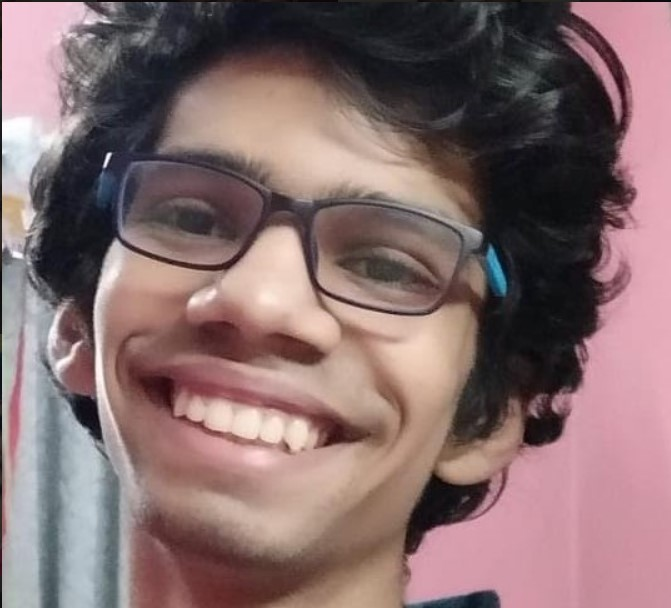

(608, 671, 3)


In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
img=cv2.imread('/content/me.jpg')    # reading the image in jpg format
cv2_imshow(img) # displaying the image
print(img.shape) # printing its shape

**Answer** \
608 denotes the **Image height** in number of pixels

671 denotes the **Image width** in number of pixels

3 denotes the **number of channels** which are red blue and green

**Question 2**\
To print the pixel intensities of a small section of the main image, check how various ranges are addressed, and
comment on where the origin of the image is

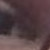

87
[[[ 87  84 106]
  [ 84  81 103]
  [ 77  74  96]
  ...
  [ 77  70 103]
  [ 79  73 104]
  [ 80  74 105]]

 [[ 96  93 115]
  [ 94  91 113]
  [ 88  85 107]
  ...
  [ 76  69 102]
  [ 79  73 104]
  [ 79  73 104]]

 [[104 102 122]
  [105 103 123]
  [102 100 120]
  ...
  [ 75  68 101]
  [ 78  72 103]
  [ 78  72 103]]

 ...

 [[104 106 136]
  [103 105 135]
  [102 105 133]
  ...
  [ 47  48  74]
  [ 50  51  77]
  [ 69  73  98]]

 [[103 105 135]
  [103 105 135]
  [104 106 136]
  ...
  [ 49  50  78]
  [ 61  62  90]
  [ 89  92 120]]

 [[107 109 139]
  [107 109 139]
  [107 109 139]
  ...
  [ 56  59  87]
  [ 86  89 117]
  [114 118 146]]]
Data Type of the image: uint8
 Maximum intensity: 146
 Minimum intensity: 32


In [ ]:
i=img[200:250,200:250] # taking a small section of the main image img
cv2_imshow(i)
print(img[200,200,0]) # printing the pixel intensity at the origin
print(i) # printing the pixel intensities of the image section
print('Data Type of the image: '+ str(i.dtype) +'\n','Maximum intensity: '+ str(np.max(i)) +'\n','Minimum intensity: '+ str(np.min(i)))

**Answer**\
The various ranges of intensities are ranging from 32 to 146 and are of the data type uint8(0-255)

The origin of the section of image taken is at (200,200,0)

**Question 3**\
Overwrite the values in the small window with 255 and display the new image and comment

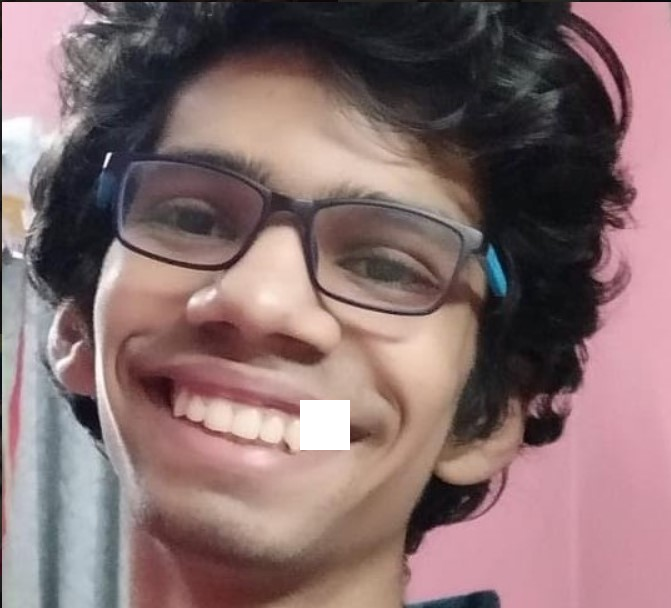

In [ ]:
im=img.copy()
im[400:450,300:350]=255 #Overwriting the values in the small window with 255
cv2_imshow(im)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Answer**\
The window in which the values of the intensities were overwritten with 255 appear as a **white patch** as 255 corresponds to the maximum intensity.

**Question 4**
Overwrite the values in the small window with 256 and display the new image and comment

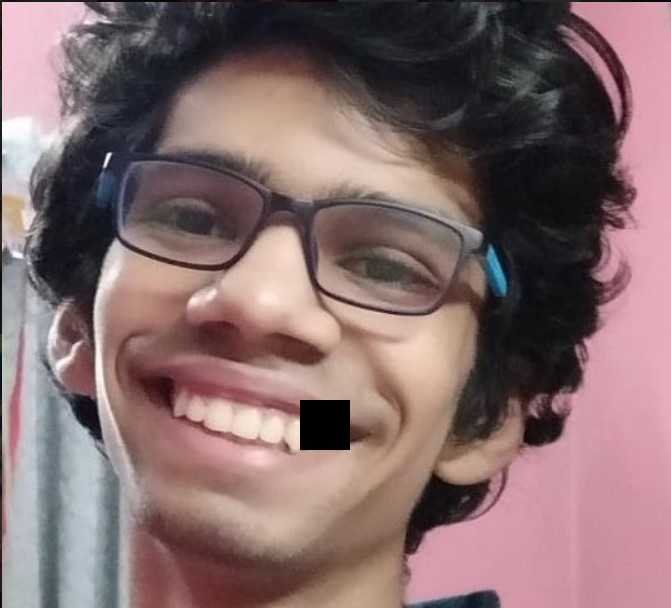

In [ ]:
im=img.copy()
im[400:450,300:350]=256 #Overwriting the values in the small window with 256
cv2_imshow(im)

The window in which the values of the intensities were overwritten with 256 appear as a **black patch** as 256 is interpreted as 0 intensity as the data type is uint8(integer values from 0-255) .

**Question 5**\
Crop a margin of a few pixels from all four sides and store the cropped image in a new image array, and
display the cropped image

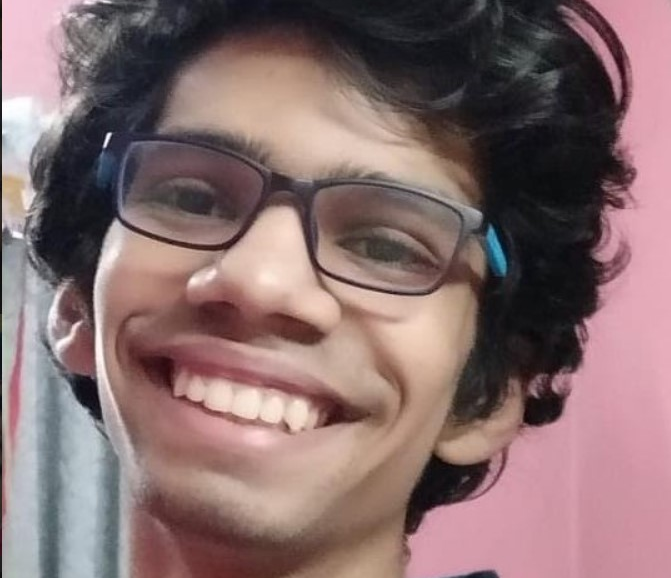

In [ ]:
im=img[10:(img.shape[0]-10)][10:(img.shape[1]-10)] # crop 10 pixels from all the 4 sides
cv2_imshow(im)

**Question 6**\
Save it as a new image file in png format

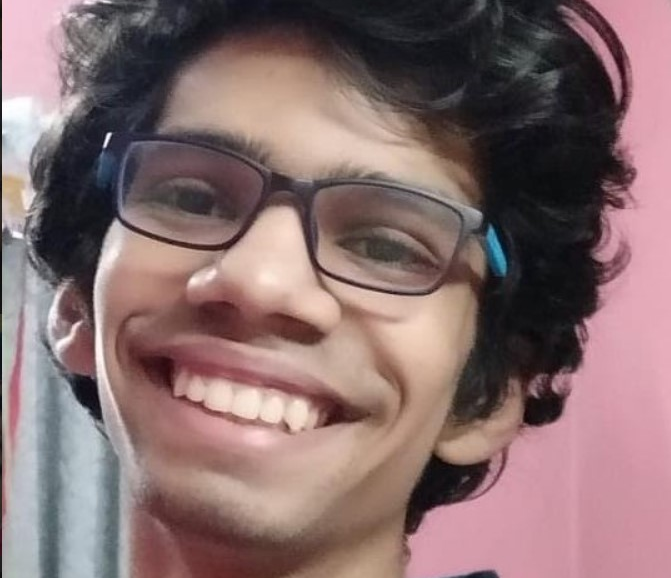

In [ ]:
cv2.imwrite('/content/save.png',im) #Saving the cropped image im as a new image file in png format
a=cv2.imread('/content/save.png')
cv2_imshow(a)

**Question 7**\
Add 50 to all the pixel values of the original image, display the new image and comment on the results

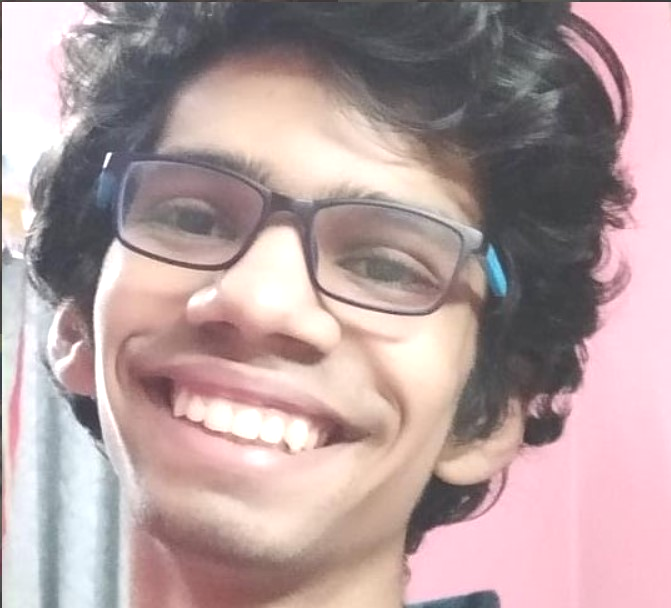

In [ ]:
i=img.copy()
i=i.astype('float')
i+=50 #Adding 50 to all the pixel values of i
np.clip(i,0,255).astype('uint8')
cv2_imshow(i) # displaying the image

**Answer**
Since the intensity values for all the pixels are increased by 50 the image seems much brighter than before

**Question 8**
Invert the y-axis to create a mirror image and display it

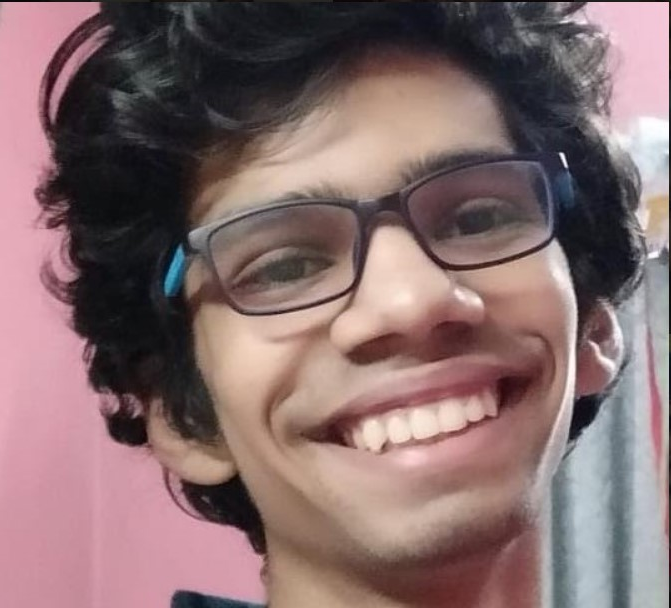

In [ ]:
i=img.copy()
for j in range(img.shape[1]):
    i[:,j]=img[:,img.shape[1]-1-j] # Taking the mirrored y-coordinate
cv2_imshow(i)

**Question 9**\
Take a night shot of your own, convert it to greyscale, and display its histogram

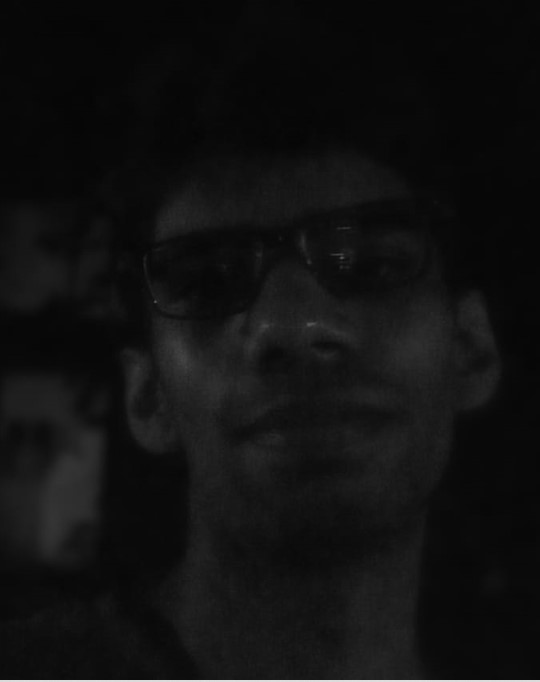

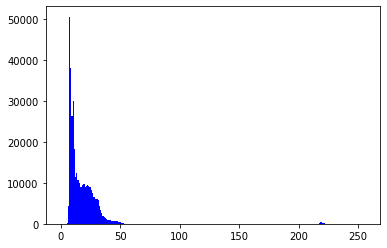

In [ ]:
m=cv2.imread('/content/m1.jpg',0) #2nd Argument is 0 for grayscale
cv2_imshow(m)
plt.hist(m.ravel(),bins=256,range=(0,256),color='blue') # displaying its histogram with 256 bins by making the image into a one dimenional array
plt.show()

**Question 10**\
Brighten the image by multiplying pixel values with a>1, and find a good value of a

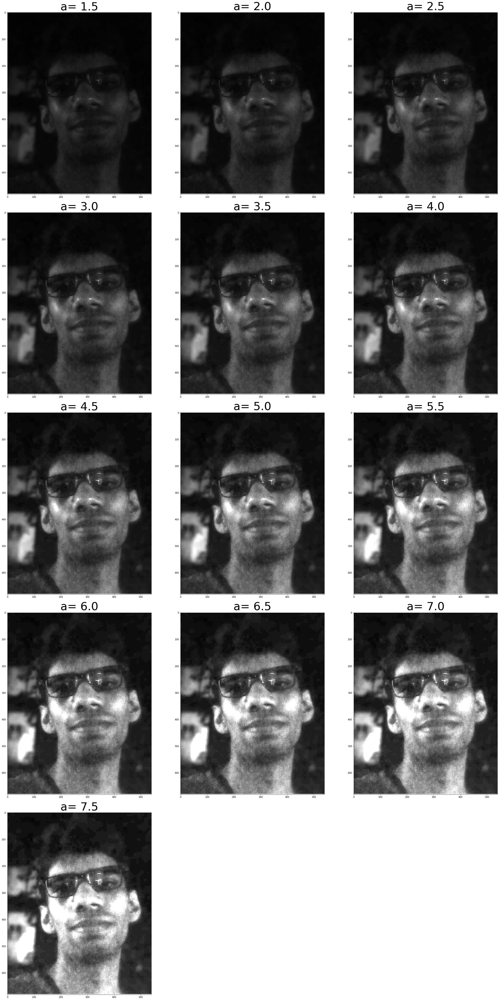

In [ ]:
m=m.astype('float')
k=m.copy()
plt.figure(figsize=(40,80))     #for figure size
plt.subplots_adjust(hspace=0.1,wspace=0.1)
for i in range(13):
    plt.subplot(5,3,i+1)
    plt.title('a= ' + str(1.5+0.5*i),{'fontsize': 50})
    k=m*(1.5+0.5*i) #  multiplying the pixel values
    k=np.clip(k,0,255).astype('uint8') # clipping the image in [0,255] and converting it into uint8
    plt.imshow(k,cmap='gray') # displaying the image in grayscale
plt.show()


**Answer**\
**a** = **5.5** seems to be a good value for a

**Question 11**
Try to enhance it using power transform, display results for different gammas, and find the best (subjective)
gamma

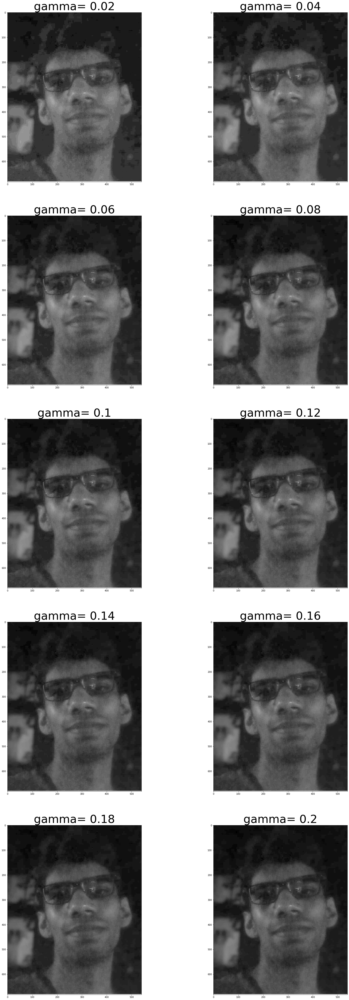

In [ ]:
m=cv2.imread('/content/m1.jpg',0)
m=m.astype(float)
t=m.copy()
plt.figure(figsize=(30,80))  #for figure size
plt.tight_layout()
plt.axis
for i in range(10):
    plt.subplot(5,2,i+1)
    plt.title('gamma= '+ str(round(0.02+ 0.02*i,2)),{'fontsize': 50})
    t=255*(m/255)**(round(0.02+ 0.02*i,2)) # gamma transformation
    k=np.clip(t,0,255).astype('uint8') # clipping the image in [0,255] and converting it into uint8
    plt.imshow(k,cmap='gray') # displaying the image in grayscale
plt.show()


**Answer**\
A gamma value of about 0.6 seems to be the most appropriate value

**Question 12**\
Perform histogram equalization to enhance it and display the histogram. Comment on why the histogram is
not flat

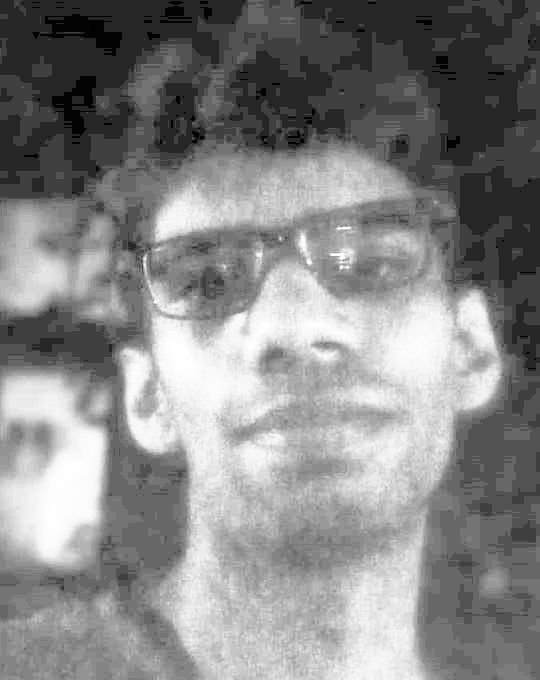

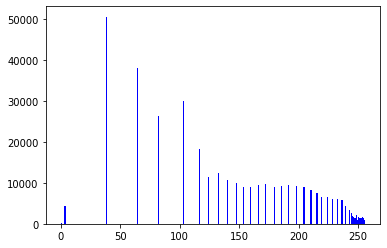

In [ ]:
m=cv2.imread('/content/m1.jpg',0)
l=cv2.equalizeHist(m) # Performing histogram equalization to enhance the image
cv2_imshow(l)
plt.hist(l.ravel(),bins=256,range=(0,256),color='blue')# displaying the histogram with 256 bins
plt.show()

**Answer**\
The method/transformation used for histogram equalization assumes continuous intensity values from 0 to 255 and also assumes **continuous Cumulative Distribution function** which is not the case due to Sampling and Quantisation.Due to this **discrete** nature of values the histogram is not flat

**Question 13**\
Think of a good target histogram and do histogram specification (histogram matching)

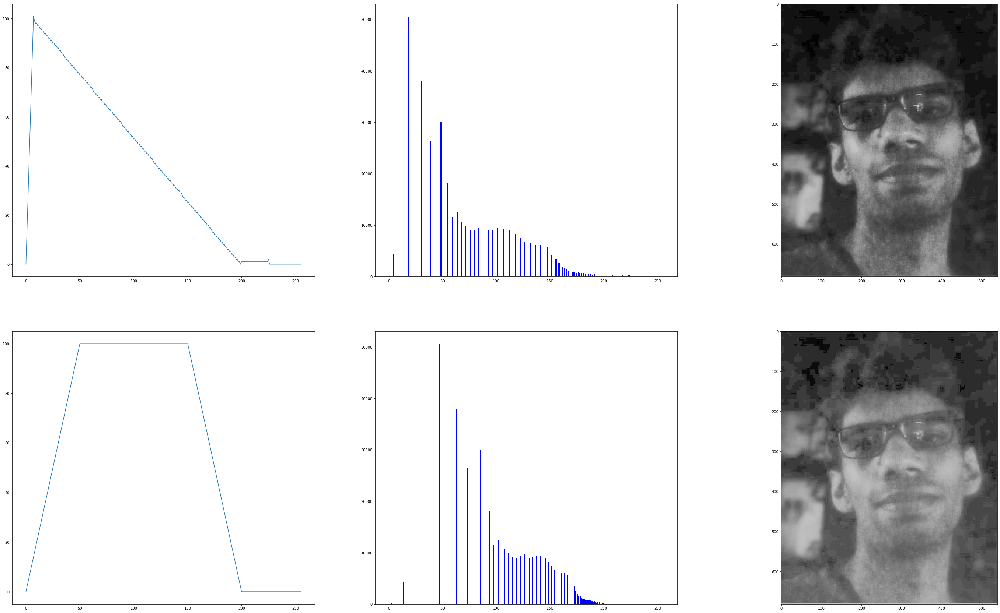

In [ ]:
img=cv2.imread('/content/m1.jpg',0)
# function for finding CDF with an array containing no. of pixels for each intensity value
def cdf(r):
    z=r.copy()
    for i in range(255):
        z[i+1]+=z[i] #adding previous value to the sucessive value
    z=z/z[255] # CDF lies between 0 and 1
    return z
# function for returning target image given target histogram
def f(img,target):
    x=np.zeros(256,dtype='float')
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            x[img[i,j]]+=1 #getting the no. of pixels with a particular intensity
    z=x.copy()
    for i in range(255):
        z[i+1]+=z[i] #adding previous value to the sucessive value
    z=z/z[255] # CDF lies between 0 and 1
    s=np.interp(z,target,np.arange(256)) # s=T(r) F_s(T(r))=F_r(r)
    s=np.clip(np.round(s),0,255).astype('uint8') # intensity is discrete and in [0,255]
    s=s[img.ravel()].reshape(img.shape) #transforming r into s=T(r)
    return s

#creating a fast rising and slow decaying triangular function
x=np.arange(256)
y=x.copy()
y1=x.copy()
y[0:8]=x[0:8]*101/7 #fast rising
y[8:200]=((x[8:200]-7)*-100/193)+100 #slow decaying
y[200:226]=((x[200:226]-200)/25)+1 #preserved the general shape
y[226:251]=((x[226:251]-225)/-25)+1
y[251:256]=0

#creating a trapezium function
y1[0:51]=x[0:51]*2 # rising
y1[51:150]=100 #remaining constant
y1[150:200]=((x[150:200]-150)*-2)+100 # decaying
y1[200:256]=0

# Making subplots
plt.figure(figsize=(50,30)) #for figure size
plt.subplot(2,3,1)
plt.plot(x,y) #ploting the function y
plt.subplot(2,3,2)
plt.plot(np.arange(256),cdf(y))
plt.hist(f(img,cdf(y)).ravel(),bins=256,range=(0,256),color='blue')
plt.subplot(2,3,3)
plt.imshow(f(img,cdf(y)),cmap='gray') # displaying the image in grayscale
plt.subplot(2,3,4)
plt.plot(x,y1) #ploting the function y1
plt.subplot(2,3,5)
plt.plot(np.arange(256),cdf(y1))
plt.hist(f(img,cdf(y1)).ravel(),bins=256,range=(0,256),color='blue')
plt.subplot(2,3,6)
plt.imshow(f(img,cdf(y1)),cmap='gray') # displaying the image in grayscale
plt.show()


Histogram Matching using the **2nd Histogram** seems to be more appropriate.For making a target Histogram-I I preserved the general shape of the histogram but with **smoother Transition of levels**.I developed Histogram-II taking certain ideas from Histogram-I

# **Sources of inspiration and information**
I was inspired by the book written by Digital Image Processing by Rafael C. GONZALES and Richard E. Woods for creating a target Histogram in question 13.
I referred to Geeks for Geeks for finding out the Histogram Equalisation function used for OpenCV.